Virtual Acoustics and Immersive Audio Workshop - CCRMA Stanford University  
22.07.25 - Orchisama Das, Gloria Dal Santo
  
### L02: Artificial Reverberation 

In this assignment we will 
- Load a response measured in a shoebox room with known dimensions, source-receiver positions
- Deconvolve the sine sweep from the recorded response to extract the RIR 
- Plot the EDC, NED, and compute the broadband T60
- Synthesize the RIR with the ISM in pyroomacoustics

In [1]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import pyroomacoustics as pra

from pathlib import Path

from utils import (
    audioread,
    find_onset)
from room_acoustics.analysis import (
    compute_edc, 
    estimate_rt60,
    normalized_echo_density)
from room_acoustics.plot import (
    plot_time_domain,
    plot_spectrogram)


#### 1. Load Response and Deconvolve the RIR

We'll be using `11_Speaker_IGL_ch1.wav` and `DrySweep.wav`.  
- 1.1 Load the signals and their sampling frequency using the `audioread` function. 
- 1.2 Plot their time domain response, their spectrogram, and play them. Use `plot_time_domain` and `plot_spectrogram` from 
- 1.3 Deconvolve the signal to extract the RIR and plot it. Use the numpy's `convolve` function (The recording is fairly long! Expect it to run for a minute or so). Be careful of which `mode` to use.  

Note: the sine sweep has training and leading silence. The important information is contained between the 1st and 11th second.
You can also try to code the sine sweep yourself using the formula given in the assignment sheet. 

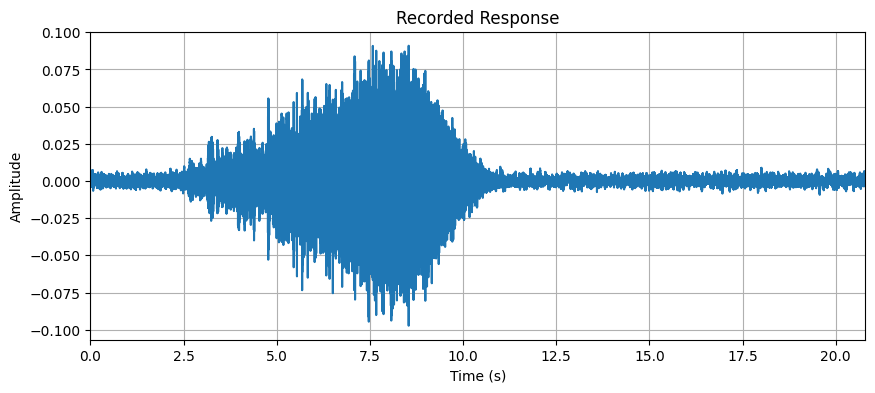

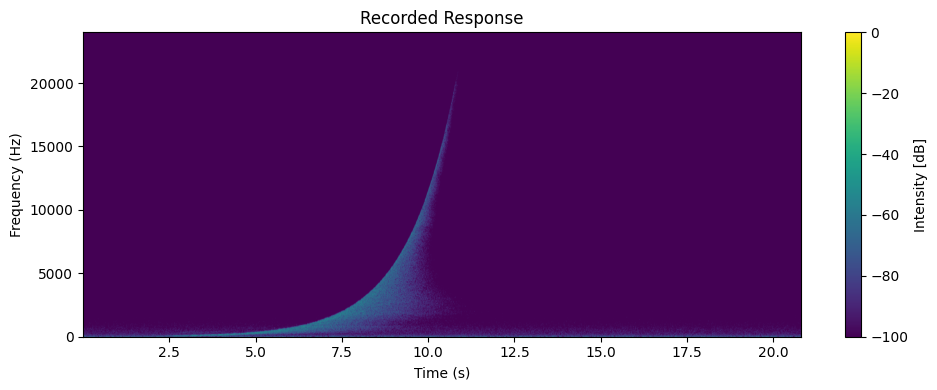

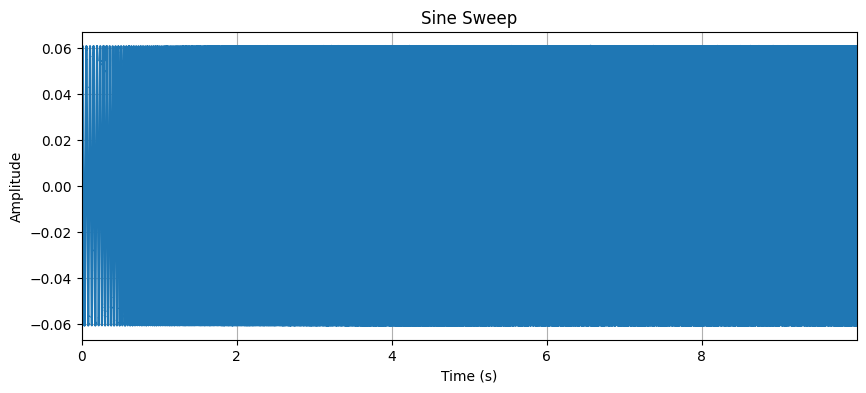

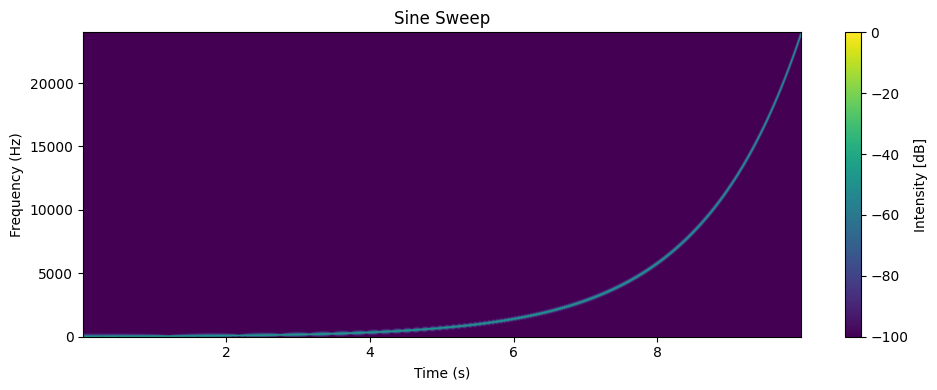

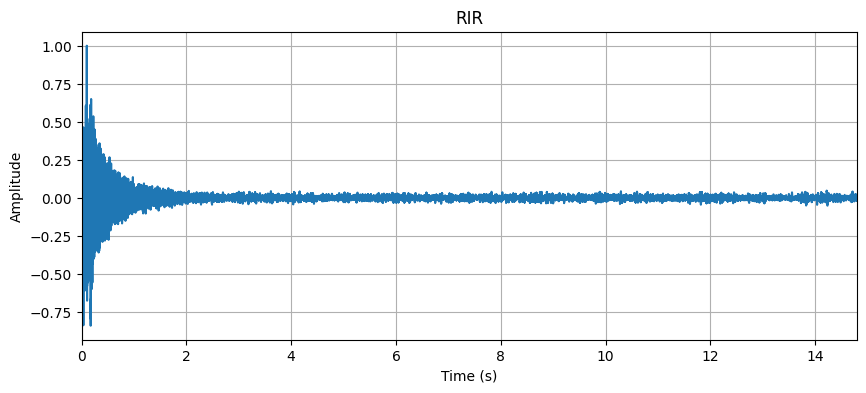

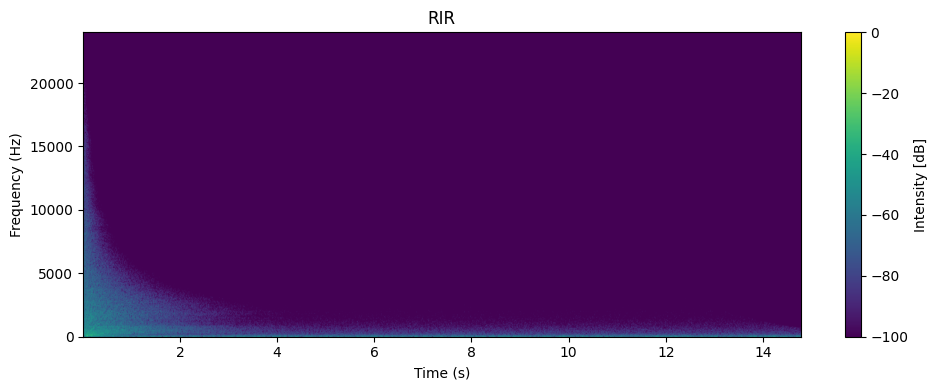

In [2]:
# --- Load and Play Recording ---
rec_path = Path('..') / 'data' / '11_Speaker_IGL_ch1.wav'
rec, fs = audioread(str(rec_path))
plot_time_domain(rec, fs, 'Recorded Response')
plot_spectrogram(rec, fs, 'Recorded Response')
ipd.display(ipd.Audio(rec, rate=fs))


# --- Load and Play Sine Sweep ---
sweep_path = Path('..') / 'data' / 'DrySweep.wav'
sweep, fs = audioread(str(sweep_path))
# trim the sweep so that it contains only the non zero part
sweep = sweep[48000:48000 + 10*fs]
plot_time_domain(sweep, fs, 'Sine Sweep')
plot_spectrogram(sweep, fs, 'Sine Sweep')
ipd.display(ipd.Audio(sweep, rate=fs))


# --- Deconvolve the Recording with the Sine Sweep to Extract RIR ---

# Create an inverse sweep by flipping the sweep signal
inverse_sweep = np.flip(sweep)
# Deconvolve the recording with the inverse sweep to extract the RIR
from scipy.signal import fftconvolve
rir = fftconvolve(rec, inverse_sweep, mode='same') 
# alternatively, you can use np.convolve, but fftconvolve is more efficient for large signals
# rir = np.convolve(rec, inverse_sweep, mode='same') 

# Normalize the RIR to have maximum absolute value of 1
rir = rir[:len(rec)]/max(abs(rir))
# Find and remove the silence before the onset of the RIR (you can use the `find_onset` function)
rir = rir[find_onset(rir).item()-int(0.1*fs):] # here we leave 100ms of silence
# plot time response and spectrogram 
plot_time_domain(rir, fs, "RIR")
plot_spectrogram(rir, fs, "RIR")

ipd.display(ipd.Audio(rir, rate=fs))


#### 2. Extract the Acoustic Parameters

For the obtained RIR
- 2.1 Compute and plot the EDC, T60, and NED using the functions implemented during Assignment 1

Note: compute the NED only for the first 4 seconds as it gets very noisy after that

/Users/dalsag1/Aalto Dropbox/Gloria Dal Santo/aalto/workshop/vaia-25/lectures/git/VAIAWorkshop25Public/src/room_acoustics/analysis.py:109: RuntimeWarning: invalid value encountered in log10
  out = 10 * np.log10(out)


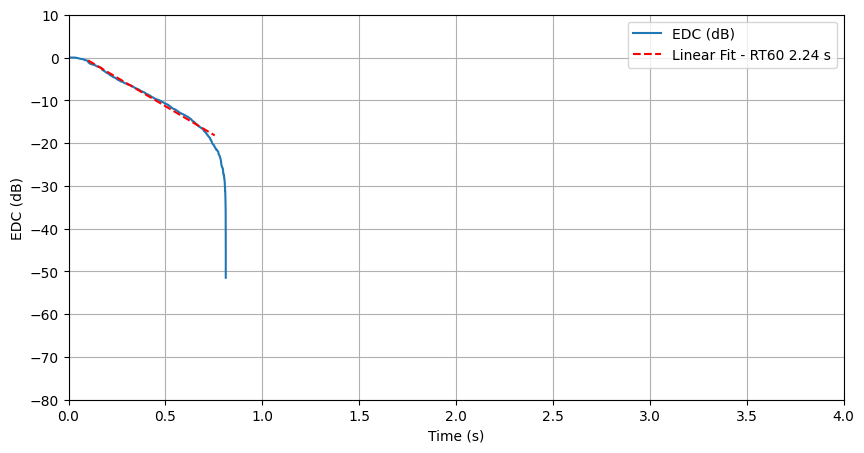

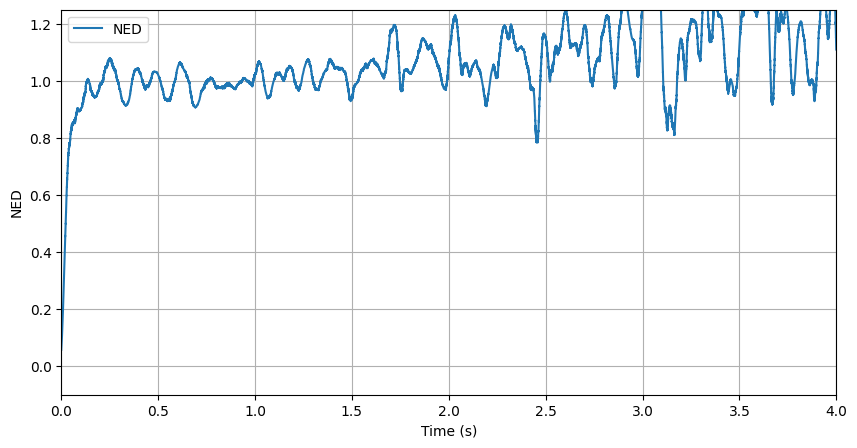

In [3]:
# --- Compute the EDC, estimate the T60 and compute the NED (Ref: Lecture 1) ---

# Subtract noise floor (Plot the EDC before subtracting the noise, you'll notice that it is very noisy)
noise_level = np.sqrt(np.mean(rir[-int(fs*0.05):]**2))
# Compute the EDC
edc_db = compute_edc(rir, energy_norm=True, subtract_noise=True, noise_level=noise_level)
time = np.arange(len(edc_db)) / fs
# Estimate RT60 from the EDC
decay_start_db, decay_end_db = -1, -21
rt60, slope, intercept, valid_range = estimate_rt60(edc_db, time, decay_start_db, decay_end_db)


plt.figure(figsize=(10, 5))
plt.plot(time, edc_db, label="EDC (dB)")
plt.plot(time[valid_range], slope * time[valid_range] + intercept, 'r--', label=f"Linear Fit - RT60 {rt60:.2f} s")
plt.xlabel("Time (s)")
plt.ylabel("EDC (dB)")
plt.legend()
plt.grid(True)
plt.ylim(-80, 10)
plt.xlim([0, 4])
plt.show()

# compute the NED only for the first 4 seconds as it gets very noisy after that
ned = normalized_echo_density(rir[:int(4.0*fs)], fs, window_length_ms=100, use_local_avg=True)
time = np.arange(len(ned)) / fs
plt.figure(figsize=(10, 5))
plt.plot(time, ned, label="NED")
plt.xlabel("Time (s)")
plt.ylabel("NED")
plt.legend()
plt.grid(True)
plt.ylim(-0.1, 1.25)
plt.xlim([0, 4])
plt.show()

#### 3. ISM synthesis of the RIR 

Use `pyroomacoustics` to synthesize the RIR given the room dimensions, the absorption and scattering properties of the surfaces, and source-receiver positions.
- 3.1 Instantiate the Shoebox class from pyroomacoustics. References: https://github.com/LCAV/pyroomacoustics/blob/f4144d216fd8776a91f40b600ee1a30bbcd228da/pyroomacoustics/room.py#L2987 and https://github.com/LCAV/pyroomacoustics/blob/master/examples/room_shoebox_3d_rt.py (the latter shows you an example on how to use it)
- 3.2 Run the usual acoustic parameters analysis and compare them to those of the original RIR 
- 3.3 Try different configurations (different orders of image sources, with and without ray tracing)



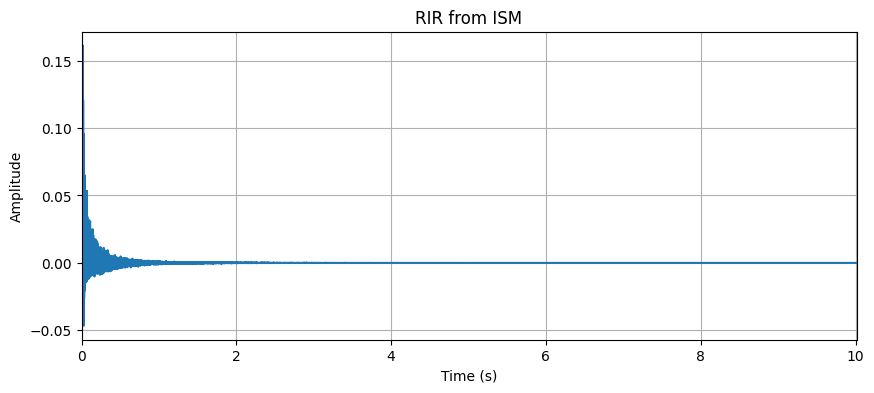

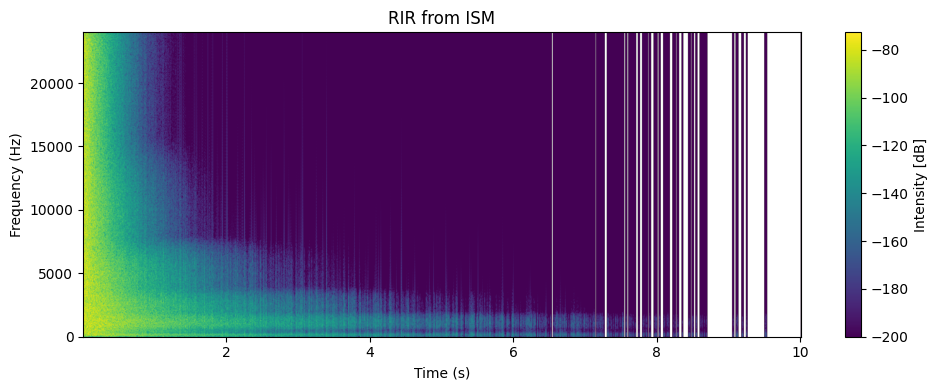

In [ ]:
# --- ISM synthesis of the RIR ---
room_dims = [6.1, 12.2, 6.1]  # Dimensions of the racquetball court (m)
source_pos = [5.3, 6.7, 1.52]  # Position of the source (m)
mic_pos = [1, 10.5, 1.52]  # Position of the microphone (m)

floor_abs = {
    'description': 'Wooden Floor',
    'coeffs': [0.150, 0.150, 0.110, 0.100, 0.070, 0.060, 0.070, 0.070],
    'center_freqs': [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}
wall_abs = {
    'description': 'Wooden Walls',
    'coeffs': [0.042, 0.037, 0.039, 0.012, 0.004, 0.003, 0.014, 0.04],
    'center_freqs': [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}
scattering = {
    "description": "Random diffuser", 
    "coeffs": [0.01, 0.01, 0.08, 0.08, 0.05, 0.08, 0.1, 0.1],
    "center_freqs": [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}

materials = pra.make_materials(
    ceiling=(wall_abs, scattering),
    floor=(floor_abs, scattering),
    east=(wall_abs, scattering),
    west=(wall_abs, scattering),
    north=(wall_abs, scattering),
    south=(wall_abs, scattering),
)

 # You might want to add ray tracing to better capture the later reflections and can model scattering.
params = {
    "ISM_RayTracing": {"max_order": 20, "ray_tracing": True}, 
    "ISM_20": {"max_order": 20, "ray_tracing": False},
    "ISM_50_RayTracing": {"max_order": 50, "ray_tracing": True},
}

shoebox = (
    pra.ShoeBox(
        room_dims,
        materials=materials,
        fs=fs,
        max_order=params['ISM_RayTracing']["max_order"],
        ray_tracing=params['ISM_RayTracing']["ray_tracing"],
        temperature=20,
        air_absorption=True,
        use_rand_ism=True   # will introduce a random displacement of the image sources
    )
    .add_source(source_pos)   
    .add_microphone(mic_pos)
)

# run the synthesis
shoebox.image_source_model()
shoebox.ray_tracing()
shoebox.compute_rir()
rir_ism = shoebox.rir[0][0].copy()
plot_time_domain(rir_ism, fs, title=f'RIR from ISM')
plot_spectrogram(rir_ism, fs, title='RIR from ISM', clim=[-200, None])
rt60_sabine = shoebox.rt60_theory(formula="sabine")
ipd.display(ipd.Audio(rir_ism, rate=fs))

RT60 from ISM: 0.87 s, RT60 from Sabine: 2.15 s


/Users/dalsag1/Aalto Dropbox/Gloria Dal Santo/aalto/workshop/vaia-25/lectures/git/VAIAWorkshop25Public/src/room_acoustics/analysis.py:109: RuntimeWarning: divide by zero encountered in log10
  out = 10 * np.log10(out)


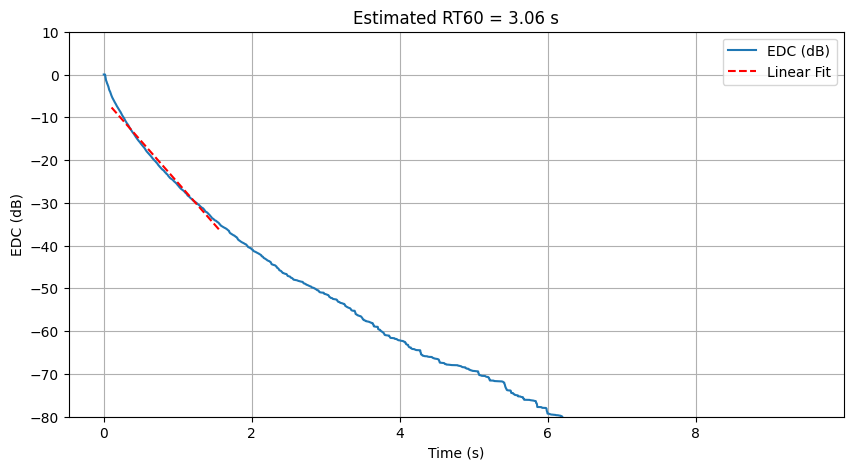

Estimated RT60: 3.06 seconds


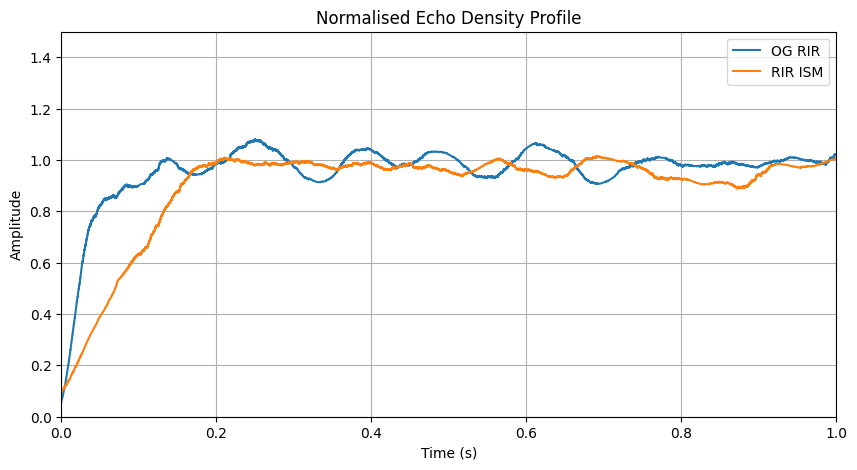

In [15]:
# --- Compute the EDC, estimate the T60 and compute the NED ---
print(f"RT60 from ISM: {rt60:.2f} s, RT60 from Sabine: {rt60_sabine:.2f} s")

edc_db_ism = compute_edc(rir_ism, energy_norm=True)
time = np.arange(len(edc_db_ism)) / fs
decay_start_db, decay_end_db = -5, -35
rt60, slope, intercept, valid_range = estimate_rt60(edc_db_ism, time, decay_start_db, decay_end_db)

plt.figure(figsize=(10, 5))
plt.plot(time, edc_db_ism, label="EDC (dB)")
plt.plot(time[valid_range], slope * time[valid_range] + intercept, 'r--', label="Linear Fit")
plt.xlabel("Time (s)")
plt.ylabel("EDC (dB)")
plt.title(f"Estimated RT60 = {rt60:.2f} s")
plt.legend()
plt.grid(True)
plt.ylim(-80, 10)
plt.show()
print(f"Estimated RT60: {rt60:.2f} seconds")

ned_ism = normalized_echo_density(
    rir_ism, 
    fs,
    window_length_ms=100, 
    use_local_avg=True
)
plt.figure(figsize=(10, 5))
plt.plot(np.arange(len(ned))/fs, ned, label="OG RIR")
plt.plot(np.arange(len(ned_ism))/fs, ned_ism, label="RIR ISM")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.xlim(0, 1)
plt.ylim(0, 1.5)
plt.title("Normalised Echo Density Profile")
plt.legend()
plt.grid(True)
plt.show()


#### 4. Convolve

Convolve the extracted and generated RIRs with the dry signals `data/Drums.wav`, `data/Sax.wav`, and `data/Speech.wav`.

In [16]:
# --- Convolve Anechoic Sounds with RIRs ---
anechoic = ['Drums', 'Sax', 'Speech']

for filename in anechoic:
    rec_path = Path('..') / 'data' / f'{filename}.wav'
    rec, fs = audioread(str(rec_path))
    
    # Convolve the recording with the RIR
    convolved = fftconvolve(rec, rir, mode='full')
    convolved = convolved[:len(rec)] /max(abs(convolved))
    print(f"Convolved {filename} with RIR from recorded RIR")
    ipd.display(ipd.Audio(convolved, rate=fs))

for filename in anechoic:
    rec_path = Path('..') / 'data' / f'{filename}.wav'
    rec, fs = audioread(str(rec_path))
    
    # Convolve the recording with the RIR
    convolved = fftconvolve(rec, rir_ism, mode='full')
    convolved = convolved[:len(rec)] / max(abs(convolved))
    print(f"Convolved {filename} with RIR from ISM")
    ipd.display(ipd.Audio(convolved, rate=fs))


Convolved Drums with RIR from recorded RIR


Convolved Sax with RIR from recorded RIR


Convolved Speech with RIR from recorded RIR


Convolved Drums with RIR from ISM


Convolved Sax with RIR from ISM


Convolved Speech with RIR from ISM
